In [1]:
# transfer learning on cat/dog model to also classify flowers

# flower set: https://www.kaggle.com/sauravagarwal/flower-classificationuhu
#             https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz
#            pexels

# resources: https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/
#            https://machinelearningmastery.com/how-to-develop-a-convolutional-neural-network-to-classify-photos-of-dogs-and-cats/
#            https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html
#            https://www.askpython.com/python/examples/list-files-in-a-directory-using-python
#            https://stackoverflow.com/questions/58072362/keras-compute-output-shape-not-working-for-custom-layer

In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import preprocessing
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, Dense, Flatten, Dropout, InputLayer, GlobalAveragePooling2D, RepeatVector, Input, Reshape
from tensorflow.keras.layers import experimental
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array

import numpy as np
from numpy import asarray
from numpy import argmax

import glob

import os

from IPython.display import display

import PIL
from PIL import Image

from matplotlib import pyplot as plt

# TensorBoard
%reload_ext tensorboard
import datetime

In [3]:
BATCHSIZE = 32

In [4]:
base_model = load_model('catdog.h5')

In [5]:
base_model.include_top = False

In [6]:
trainDir = '/Users/kaylaneal/Downloads/alzResearch/flower_photos/train'

testDir = '/Users/kaylaneal/Downloads/alzResearch/flower_photos/test'

In [7]:
trainGen = ImageDataGenerator(rescale = 1./255, shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True)

testGen = ImageDataGenerator(rescale = 1./255)

In [8]:
trainSet = trainGen.flow_from_directory(trainDir, target_size = (64,64), batch_size = 32, class_mode = 'categorical')

testSet = testGen.flow_from_directory(testDir, target_size = (64,64), batch_size = 32, class_mode = 'categorical')

print( "labels: ", "train -", trainSet.class_indices, "test -", testSet.class_indices)

Found 2689 images belonging to 2 classes.
Found 208 images belonging to 2 classes.
labels:  train - {'roses': 0, 'sunflowers': 1} test - {'roses': 0, 'sunflowers': 1}


In [9]:
base_model.trainable = False

In [10]:
SHAPE = (64, 64, 3)

In [11]:
# add new classifier layers
flat = Flatten(name = 'flat2')(base_model.layers[0].output)
class1 = Dense(128, activation='relu', kernel_initializer='he_uniform', name = 'dense2')(flat)
dact = Activation('relu', name = 'dact')(class1)
dro = Dropout(0.2, name = 'dro')(dact)
c2 = Dense(64, activation = 'relu', name = 'dense3')(dro)
dact2 = Activation('relu', name = 'dact2')(c2)
drop1 = Dropout(0.3, name = 'ou')(dact2)
lastd = Dense(2, activation='softmax', name = 'dense4')(drop1)
output = Activation('softmax', name = 'dact3')(lastd)
# define new model
model = tf.keras.Model(inputs=base_model.inputs, outputs=output)

In [12]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 62, 62, 32)        896       
_________________________________________________________________
flat2 (Flatten)              (None, 123008)            0         
_________________________________________________________________
dense2 (Dense)               (None, 128)               15745152  
_________________________________________________________________
dact (Activation)            (None, 128)               0         
_________________________________________________________________
dro (Dropout)                (None, 128)               0         
_________________________________________________________________
dense3 (Dense)               (None, 64)                8256  

In [13]:
model.compile(optimizer = tf.keras.optimizers.Adam(
   learning_rate = 0.0001), loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [14]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
callbacks = [tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 5, verbose = 1, restore_best_weights = True)]

In [15]:
%tensorboard --logdir logs/fit

In [16]:
history = model.fit(trainSet, validation_data=testSet, epochs=32, callbacks = [callbacks, tensorboard_callback])

Epoch 1/32
85/85 [==============================] - 29s 336ms/step - loss: 0.4728 - accuracy: 0.8293 - val_loss: 0.4725 - val_accuracy: 0.8317
Epoch 2/32
85/85 [==============================] - 29s 342ms/step - loss: 0.4400 - accuracy: 0.8650 - val_loss: 0.4312 - val_accuracy: 0.8798
Epoch 3/32
85/85 [==============================] - 29s 349ms/step - loss: 0.4333 - accuracy: 0.8754 - val_loss: 0.4523 - val_accuracy: 0.8558
Epoch 4/32
85/85 [==============================] - 31s 361ms/step - loss: 0.4357 - accuracy: 0.8706 - val_loss: 0.4269 - val_accuracy: 0.8846
Epoch 5/32
85/85 [==============================] - 30s 348ms/step - loss: 0.4321 - accuracy: 0.8762 - val_loss: 0.4510 - val_accuracy: 0.8510
Epoch 6/32
85/85 [==============================] - 29s 339ms/step - loss: 0.4267 - accuracy: 0.8817 - val_loss: 0.4275 - val_accuracy: 0.8798
Epoch 7/32
85/85 [==============================] - 32s 374ms/step - loss: 0.4169 - accuracy: 0.8933 - val_loss: 0.4489 - val_accuracy: 0.8606

In [17]:
result = model.evaluate(trainSet)

85/85 [==============================] - 25s 298ms/step - loss: 0.4026 - accuracy: 0.9067


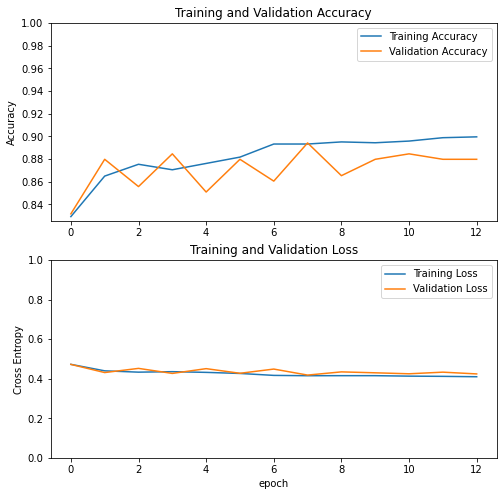

In [18]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)


plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='upper right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [19]:
trainrose = '/Users/kaylaneal/Downloads/alzResearch/flower_photos/train/roses'
trainsun = '/Users/kaylaneal/Downloads/alzResearch/flower_photos/train/sunflowers'
testrose = '/Users/kaylaneal/Downloads/alzResearch/flower_photos/test/roses' 
testsun = '/Users/kaylaneal/Downloads/alzResearch/flower_photos/test/sunflowers'

In [20]:
# List of files in complete directory
rose_list = []

"""
	Loop to extract files inside a directory

	path --> Name of each directory
	folders --> List of subdirectories inside current 'path'
	files --> List of files inside current 'path'

"""
i = 0

for path, folders, files in os.walk(trainrose):
    for file in files:
        if (i <= 15):
            rose_list.append(os.path.abspath(os.path.join(trainrose, file)))
            i += 1
        else:
            break

In [21]:
# List of files in complete directory
trose_list = []

"""
	Loop to extract files inside a directory

	path --> Name of each directory
	folders --> List of subdirectories inside current 'path'
	files --> List of files inside current 'path'

"""
i = 0

for path, folders, files in os.walk(testrose):
    for file in files:
        if (i <= 15):
            trose_list.append(os.path.abspath(os.path.join(trainrose, file)))
            i += 1
        else:
            break

In [22]:
# List of files in complete directory
tsun_list = []

"""
	Loop to extract files inside a directory

	path --> Name of each directory
	folders --> List of subdirectories inside current 'path'
	files --> List of files inside current 'path'

"""
i = 0

for path, folders, files in os.walk(testsun):
    for file in files:
        if (i <= 15):
            tsun_list.append(os.path.abspath(os.path.join(trainsun, file)))
            i += 1
        else:
            break

In [23]:
# List of files in complete directory
sun_list = []

"""
	Loop to extract files inside a directory

	path --> Name of each directory
	folders --> List of subdirectories inside current 'path'
	files --> List of files inside current 'path'

"""
i = 0

for path, folders, files in os.walk(trainsun):
    for file in files:
        if (i <= 15):
            sun_list.append(os.path.abspath(os.path.join(trainsun, file)))
            i += 1
        else:
            break

rose:  [0]


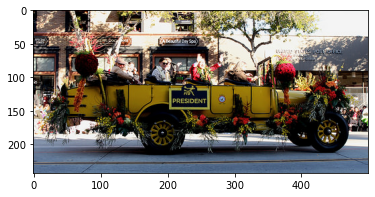

rose:  [0]


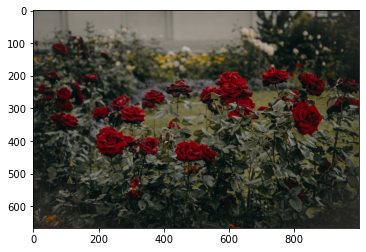

rose:  [0]


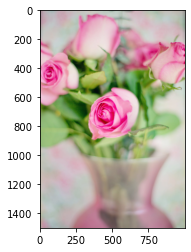

sunflower:  [1]


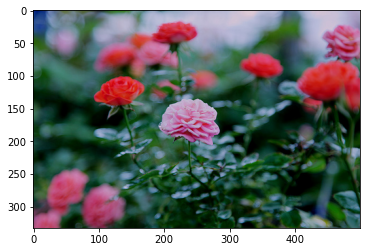

rose:  [0]


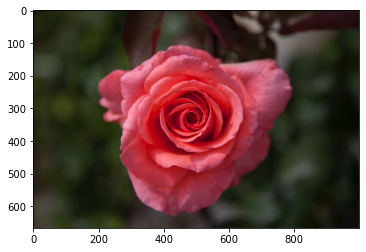

rose:  [0]


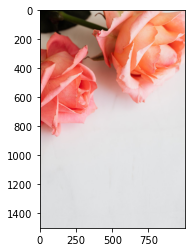

rose:  [0]


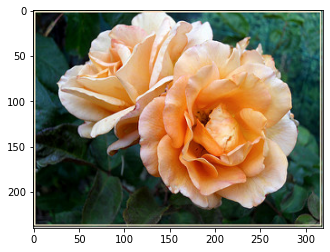

rose:  [0]


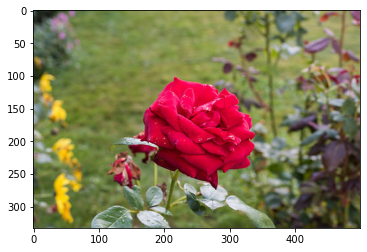

rose:  [0]


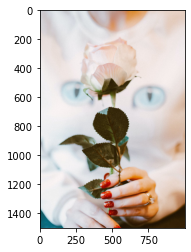

rose:  [0]


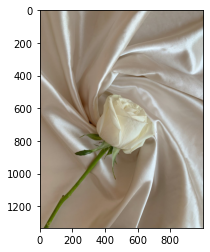

rose:  [0]


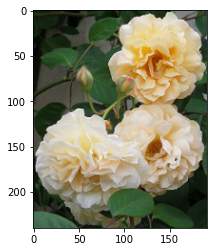

rose:  [0]


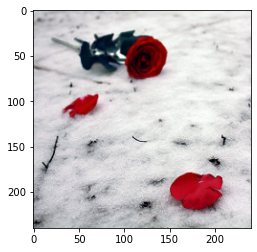

rose:  [0]


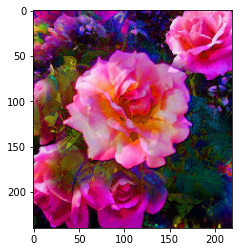

rose:  [0]


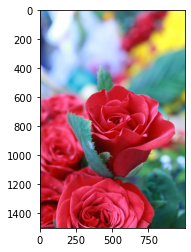

rose:  [0]


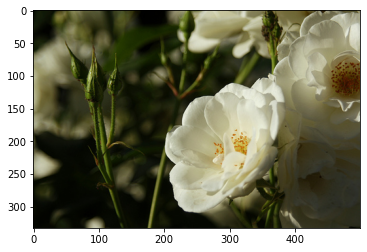

rose:  [0]


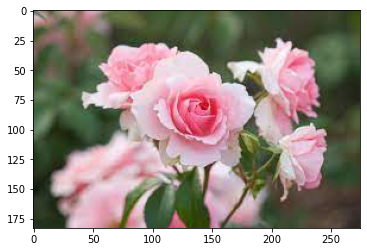

15 / 16 correct


In [24]:
j = 0
r = 0
s = 0

for test_image in rose_list:
    while (j <= 15):
        test_image= load_img(rose_list[j], target_size = SHAPE) 
        test_image = img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        test_image = test_image.reshape((-1, 64, 64, 3))
        result = model.predict(test_image, batch_size = 10)
        predic = argmax(result, axis = 1)
        printphoto = plt.imread(rose_list[j])
        phot = plt.imshow(printphoto)
        if predic < 0.5:
            print ('rose: ', predic)
            r += 1
        else:
            print ('sunflower: ', predic)
            s +=1
        plt.show()
        j +=1
        
print (r, '/', r+s, 'correct')

sunflower:  [1]


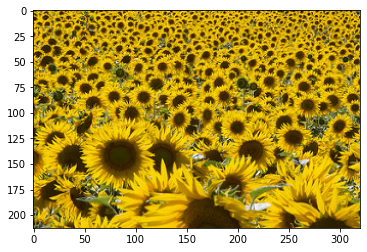

sunflower:  [1]


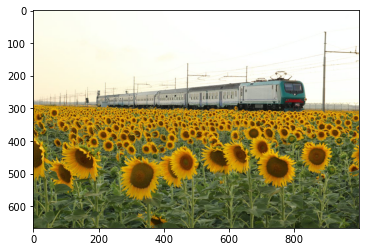

sunflower:  [1]


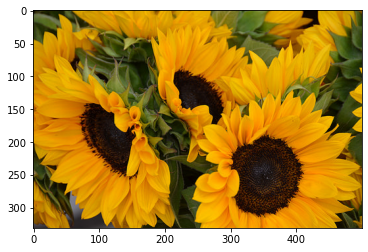

sunflower:  [1]


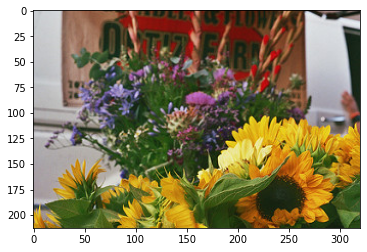

sunflower:  [1]


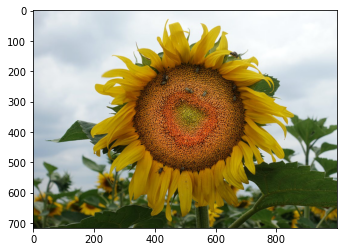

sunflower:  [1]


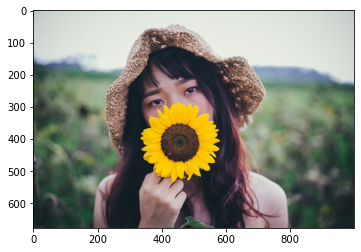

sunflower:  [1]


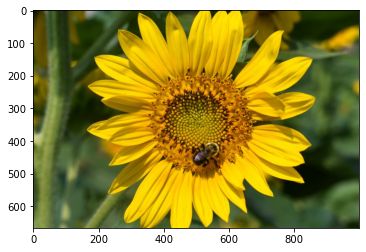

sunflower:  [1]


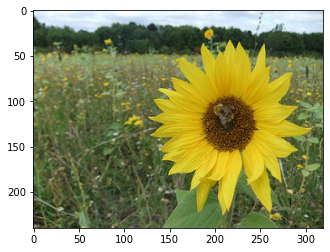

sunflower:  [1]


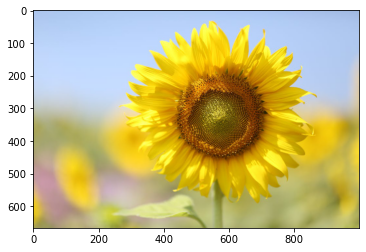

sunflower:  [1]


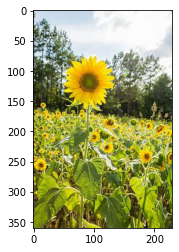

sunflower:  [1]


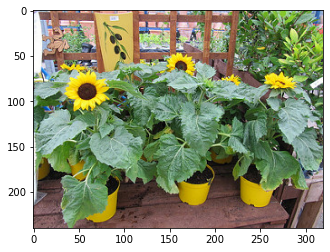

sunflower:  [1]


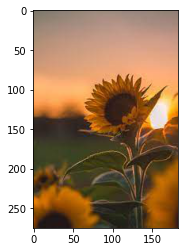

rose:  [0]


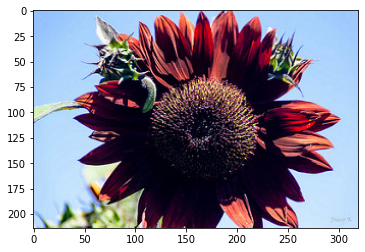

sunflower:  [1]


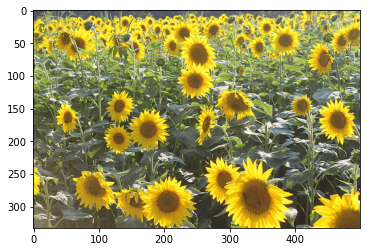

sunflower:  [1]


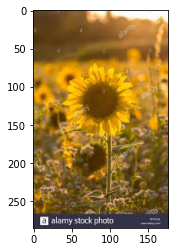

sunflower:  [1]


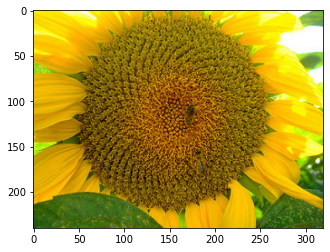

15 / 16 correct


In [25]:
j = 0
r = 0
s = 0

for test_image in sun_list:
    while (j <= 15):
        test_image= load_img(sun_list[j], target_size = SHAPE) 
        test_image = img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        test_image = test_image.reshape((-1, 64, 64, 3))
        result = model.predict(test_image, batch_size = 10)
        predic = argmax(result, axis = 1)
        printphoto = plt.imread(sun_list[j])
        phot = plt.imshow(printphoto)
        if predic < 0.5:
            print ('rose: ', predic)
            r += 1
        else:
            print ('sunflower: ', predic)
            s +=1
        plt.show()
        j +=1
        
print (s, '/', r+s, 'correct')

rose:  [0]


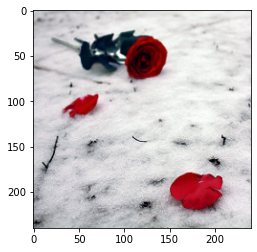

rose:  [0]


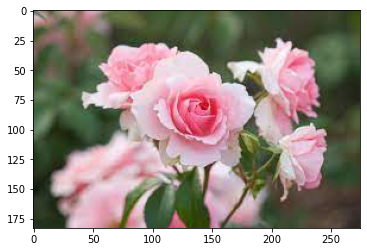

rose:  [0]


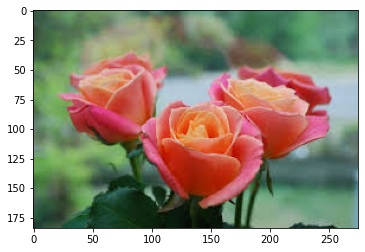

rose:  [0]


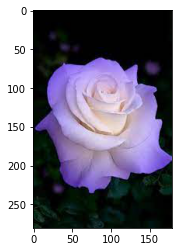

rose:  [0]


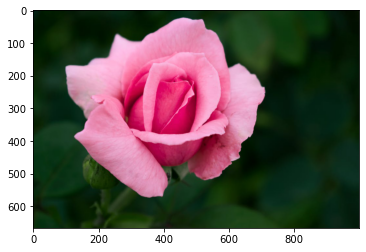

rose:  [0]


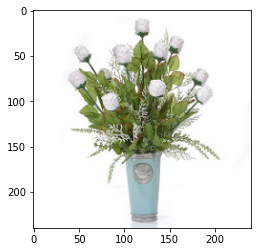

rose:  [0]


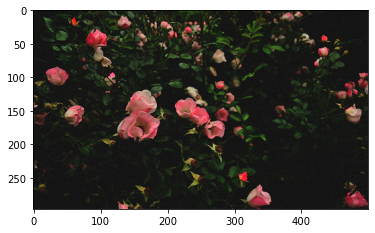

rose:  [0]


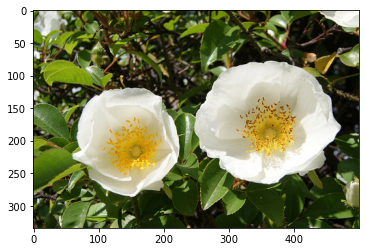

rose:  [0]


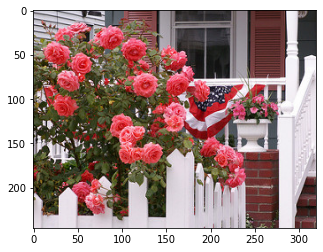

rose:  [0]


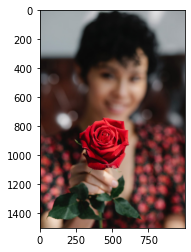

rose:  [0]


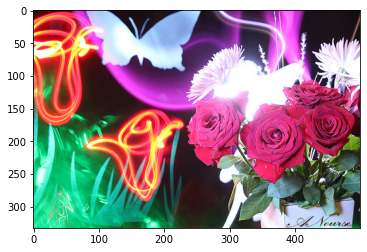

sunflower:  [1]


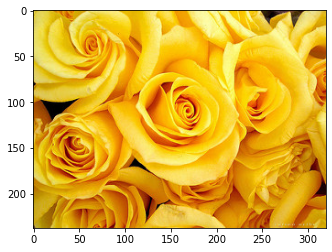

rose:  [0]


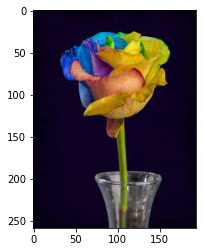

rose:  [0]


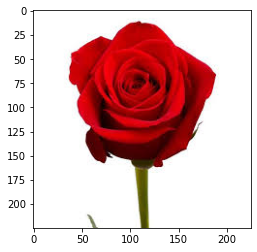

rose:  [0]


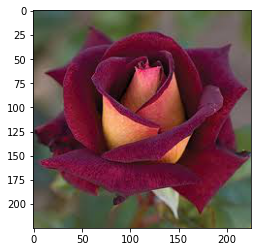

rose:  [0]


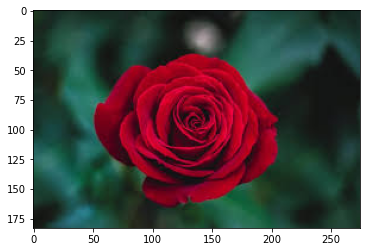

15 / 16 correct


In [26]:
j = 0
r = 0
s = 0

for test_image in trose_list:
    while (j <= 15):
        test_image= load_img(trose_list[j], target_size = SHAPE) 
        test_image = img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        test_image = test_image.reshape((-1, 64, 64, 3))
        result = model.predict(test_image, batch_size = 10)
        predic = argmax(result, axis = 1)
        printphoto = plt.imread(trose_list[j])
        phot = plt.imshow(printphoto)
        if predic < 0.5:
            print ('rose: ', predic)
            r += 1
        else:
            print ('sunflower: ', predic)
            s +=1
        plt.show()
        j +=1
        
print (r, '/', r+s, 'correct')

sunflower:  [1]


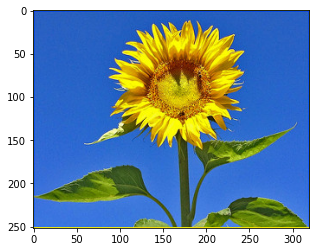

sunflower:  [1]


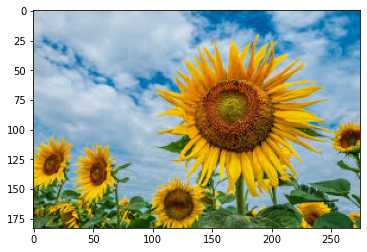

sunflower:  [1]


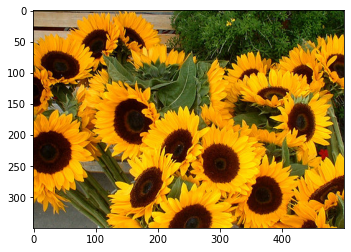

sunflower:  [1]


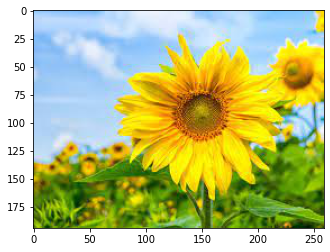

sunflower:  [1]


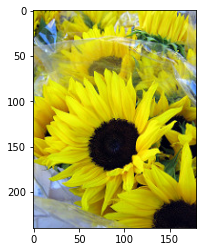

sunflower:  [1]


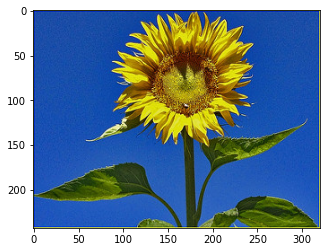

sunflower:  [1]


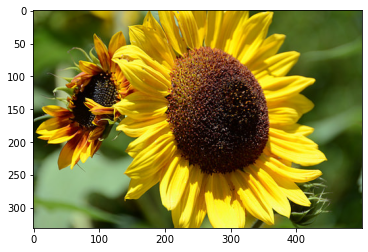

sunflower:  [1]


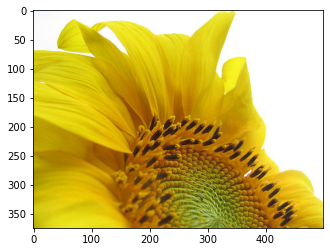

sunflower:  [1]


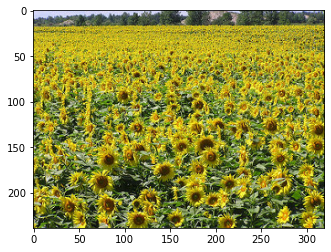

sunflower:  [1]


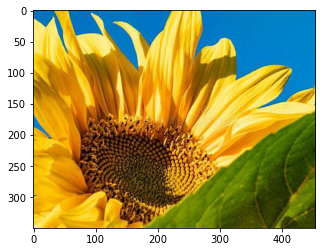

rose:  [0]


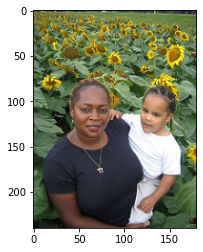

sunflower:  [1]


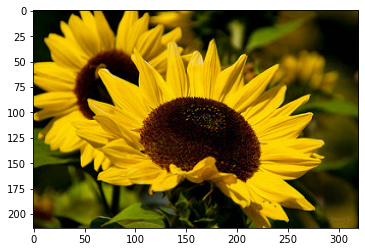

sunflower:  [1]


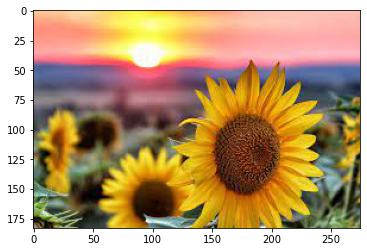

sunflower:  [1]


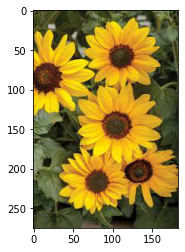

sunflower:  [1]


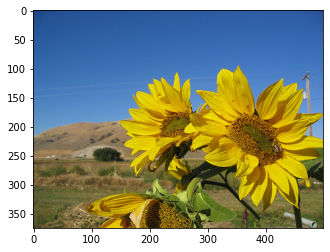

sunflower:  [1]


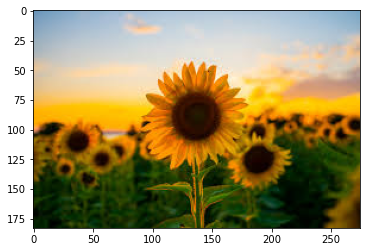

15 / 16 correct


In [27]:
j = 0
r = 0
s = 0

for test_image in tsun_list:
    while (j <= 15):
        test_image= load_img(tsun_list[j], target_size = SHAPE) 
        test_image = img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis = 0)
        test_image = test_image.reshape((-1, 64, 64, 3))
        result = model.predict(test_image, batch_size = 10)
        predic = argmax(result, axis = 1)
        printphoto = plt.imread(tsun_list[j])
        phot = plt.imshow(printphoto)
        if predic < 0.5:
            print ('rose: ', predic)
            r += 1
        else:
            print ('sunflower: ', predic)
            s +=1
        plt.show()
        j +=1
        
print (s, '/', r+s, 'correct')